In [1]:
import numpy as np
import matplotlib.pyplot as plt
from pandas import read_csv
#import math
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from vertical_profile_indecies import vprofile_indeces

print(tf.config.list_physical_devices('GPU'))
# Check if GPU is available
gpus = tf.config.list_physical_devices('GPU')
if not gpus:
    print("No GPU detected!")
else:
    print("GPUs detected:", gpus)


2025-04-06 16:35:26.117589: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1743946526.228498    4046 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1743946526.260327    4046 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-06 16:35:26.496346: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


<xarray.Dataset> Size: 15kB
Dimensions:         (valid_time: 24, pressure_level: 37, latitude: 1,
                     longitude: 1)
Coordinates:
    number          int64 8B ...
  * valid_time      (valid_time) datetime64[ns] 192B 2014-04-15 ... 2014-04-1...
  * pressure_level  (pressure_level) float64 296B 1e+03 975.0 950.0 ... 2.0 1.0
  * latitude        (latitude) float64 8B 42.69
  * longitude       (longitude) float64 8B 23.41
    expver          (valid_time) <U4 384B ...
Data variables:
    r               (valid_time, pressure_level, latitude, longitude) float32 4kB ...
    t               (valid_time, pressure_level, latitude, longitude) float32 4kB ...
    u               (valid_time, pressure_level, latitude, longitude) float32 4kB ...
    v               (valid_time, pressure_level, latitude, longitude) float32 4kB ...
Attributes:
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0


In [2]:
from metpy.io import parse_metar_to_dataframe
import pandas as pd
from tqdm import tqdm


def METAR_parse_ogimet(filename):
    date_length = 12
    METAR_df = pd.DataFrame()
    error_report = []
    with open(filename, 'r') as file:
        num_lines = len(file.readlines())
    with open('METAR_data.txt', 'r') as file:
        for line in tqdm(file, total = num_lines, desc="METARS processed"):
            try:
                line = line.strip()
                date = line[:date_length]
                METAR = line[date_length+1:]
                year = date[:4]
                month = date[4:6]
                data = parse_metar_to_dataframe(METAR, month = int(month), year = int(year))
                METAR_df = pd.concat([METAR_df, data], axis = 0)
            except KeyError as e:
                error_report.append(f"Skipping {line} due to {e}")
                continue
    print(METAR_df)
    METAR_df.to_csv("METAR_df.csv")
    if error_report:
        print("\n---------------------------- Error Report ---------------------------------------------")
        for error in error_report:
            print(error)
        print("---------------------------------------------------------------------------------------")    
    else:
        print("No errors occurred.")
    
    return

#METAR_parse_ogimet('metar_LBSF_2005-01-01_2024-12-31.txt')

METARS processed:   0%|          | 1441/353064 [00:10<41:08, 142.44it/s]


           station_id  latitude  longitude  elevation           date_time  \
station_id                                                                  
LBSF             LBSF     42.65      23.38        595 2005-01-01 00:00:00   
LBSF             LBSF     42.65      23.38        595 2005-01-01 00:30:00   
LBSF             LBSF     42.65      23.38        595 2005-01-01 01:00:00   
LBSF             LBSF     42.65      23.38        595 2005-01-01 01:30:00   
LBSF             LBSF     42.65      23.38        595 2005-01-01 02:00:00   
...               ...       ...        ...        ...                 ...   
LBSF             LBSF     42.65      23.38        595 2005-01-30 22:30:00   
LBSF             LBSF     42.65      23.38        595 2005-01-30 23:00:00   
LBSF             LBSF     42.65      23.38        595 2005-01-30 23:30:00   
LBSF             LBSF     42.65      23.38        595 2005-01-31 00:00:00   
LBSF             LBSF     42.65      23.38        595 2005-01-31 00:30:00   

In [3]:
# convert an array of values into a dataset matrix
def series_to_supervised(data, n_in=1, n_out=1, label_name = None, dropnan=True):
	"""
	Frame a time series as a supervised learning dataset.
	Arguments:
		data: Sequence of observations as a list or NumPy array.
		n_in: Number of lag observations as input (X).
		n_out: Number of observations as output (y).
		dropnan: Boolean whether or not to drop rows with NaN values.
	Returns:
		Pandas DataFrame of series framed for supervised learning.
	"""
	n_vars = 1 if type(data) is list else data.shape[1]
	
	df = pd.DataFrame(data)
	df_names = df.columns.to_list()
	cols, names = list(), list()
	# input sequence (t-n, ... t-1)
	for i in range(n_in, 0, -1):
		cols.append(df.shift(i))
		#Dont add label to features
		names += [f"{j}(t-{i})" for j in df_names]
		
		#names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
	# forecast sequence (t, t+1, ... t+n)
	for i in range(0, n_out):
		cols.append(df.shift(-i))
		if i == 0:
			names += [f"{j}(t{i})" for j in df_names]
		else:
			names += [f"{j}(t+{i})" for j in df_names]
	# put it all together
	agg = pd.concat(cols, axis=1)
	agg.columns = names
	# drop rows with NaN values
	if dropnan:
		
		agg.dropna(inplace=True)
	
	return agg


values = pd.DataFrame({"values":[x for x in range(10)]})
data = series_to_supervised(values, 2, 2)



In [47]:
pd.set_option('display.max_rows', None)  # Show all rows
pd.set_option('display.max_columns', None)  # Show all columns

dataframe = read_csv('METARs/metar_LBSF_2005-01-01_2024-12-31.txt.csv', engine='python')
#Filter only 1 year of data for easy testing
start_date = '2014-04-01'
end_date = '2014-10-01'

dataframe = dataframe[dataframe['date_time'].between(start_date, end_date)]
dataframe["date_time"] = pd.to_datetime(dataframe['date_time'])
#dataframe=dataframe[dataframe['date_time'].dt.hour.between(9, 20)]
print(dataframe)

       station_id  latitude  longitude  elevation           date_time  wind_direction  wind_speed  wind_gust  visibility current_wx1 current_wx2  current_wx3 low_cloud_type  \
164459       LBSF     42.65      23.38        595 2014-04-01 00:00:00           150.0    3.887689        NaN     10000.0         NaN         NaN          NaN            NaN   
164460       LBSF     42.65      23.38        595 2014-04-01 00:30:00            60.0    3.887689        NaN     10000.0         NaN         NaN          NaN            NaN   
164461       LBSF     42.65      23.38        595 2014-04-01 01:00:00            80.0    1.943844        NaN     10000.0         NaN         NaN          NaN            NaN   
164462       LBSF     42.65      23.38        595 2014-04-01 01:30:00             NaN    1.943844        NaN     10000.0         NaN         NaN          NaN            NaN   
164463       LBSF     42.65      23.38        595 2014-04-01 02:00:00             NaN    1.943844        NaN     10000.0

In [21]:
#Add the data from the vertical profilesto the df
import glob
import xarray as xr
import pandas as pd
import metpy
from metpy.units import units
from metpy.calc import total_totals_index, cape_cin, sweat_index, lifted_index, parcel_profile, k_index
import numpy as np
from pint.errors import UnitStrippedWarning
import warnings
warnings.simplefilter("ignore", category=UnitStrippedWarning)

# Get a list of all NetCDF files in the folder
file_list = sorted(glob.glob( "Radiosonde/*.nc"))

datasets = [xr.open_dataset(f) for f in file_list]  # Open all files
ds_merged = xr.combine_by_coords(datasets, combine_attrs="override") # Merge the files

ds_merged.to_netcdf("Radiosonde_ERA5_merged_2014.nc")
        
indeces_df = vprofile_indeces("Radiosonde_ERA5_merged_2014.nc")


<xarray.Dataset> Size: 2MB
Dimensions:         (valid_time: 3792, pressure_level: 37, latitude: 1,
                     longitude: 1)
Coordinates:
    number          int64 8B ...
  * valid_time      (valid_time) datetime64[ns] 30kB 2014-01-01 ... 2014-06-0...
  * pressure_level  (pressure_level) float64 296B 1e+03 975.0 950.0 ... 2.0 1.0
  * latitude        (latitude) float64 8B 42.69
  * longitude       (longitude) float64 8B 23.41
    expver          (valid_time) <U4 61kB ...
Data variables:
    r               (valid_time, pressure_level, latitude, longitude) float32 561kB ...
    t               (valid_time, pressure_level, latitude, longitude) float32 561kB ...
    u               (valid_time, pressure_level, latitude, longitude) float32 561kB ...
    v               (valid_time, pressure_level, latitude, longitude) float32 561kB ...
Attributes:
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:   

/home/denivt/PycharmProjects/Bachelor_thesis/vertical_profile_indecies.py:27: UserWarning: Relative humidity >120%, ensure proper units.
  Td = metpy.calc.dewpoint_from_relative_humidity(T, rew_humidity)


Processing time: 2014-01-10T12:00:00.000000000
Processing time: 2014-01-10T13:00:00.000000000
Processing time: 2014-01-10T14:00:00.000000000
Processing time: 2014-01-10T15:00:00.000000000
Processing time: 2014-01-10T16:00:00.000000000
Processing time: 2014-01-10T17:00:00.000000000
Processing time: 2014-01-10T18:00:00.000000000
Processing time: 2014-01-10T19:00:00.000000000
Processing time: 2014-01-10T20:00:00.000000000
Processing time: 2014-01-10T21:00:00.000000000
Processing time: 2014-01-10T22:00:00.000000000
Processing time: 2014-01-10T23:00:00.000000000
Processing time: 2014-01-11T00:00:00.000000000
Processing time: 2014-01-11T01:00:00.000000000
Processing time: 2014-01-11T02:00:00.000000000
Processing time: 2014-01-11T03:00:00.000000000
Processing time: 2014-01-11T04:00:00.000000000
Processing time: 2014-01-11T05:00:00.000000000
Processing time: 2014-01-11T06:00:00.000000000
Processing time: 2014-01-11T07:00:00.000000000
Processing time: 2014-01-11T08:00:00.000000000
Processing ti

/home/denivt/PycharmProjects/Bachelor_thesis/vertical_profile_indecies.py:27: UserWarning: Relative humidity >120%, ensure proper units.
  Td = metpy.calc.dewpoint_from_relative_humidity(T, rew_humidity)
/home/denivt/PycharmProjects/Bachelor_thesis/vertical_profile_indecies.py:27: UserWarning: Relative humidity >120%, ensure proper units.
  Td = metpy.calc.dewpoint_from_relative_humidity(T, rew_humidity)
/home/denivt/PycharmProjects/Bachelor_thesis/vertical_profile_indecies.py:27: UserWarning: Relative humidity >120%, ensure proper units.
  Td = metpy.calc.dewpoint_from_relative_humidity(T, rew_humidity)


Processing time: 2014-01-12T08:00:00.000000000
Processing time: 2014-01-12T09:00:00.000000000
Processing time: 2014-01-12T10:00:00.000000000
Processing time: 2014-01-12T11:00:00.000000000
Processing time: 2014-01-12T12:00:00.000000000
Processing time: 2014-01-12T13:00:00.000000000
Processing time: 2014-01-12T14:00:00.000000000
Processing time: 2014-01-12T15:00:00.000000000
Processing time: 2014-01-12T16:00:00.000000000
Processing time: 2014-01-12T17:00:00.000000000
Processing time: 2014-01-12T18:00:00.000000000
Processing time: 2014-01-12T19:00:00.000000000
Processing time: 2014-01-12T20:00:00.000000000
Processing time: 2014-01-12T21:00:00.000000000
Processing time: 2014-01-12T22:00:00.000000000
Processing time: 2014-01-12T23:00:00.000000000
Processing time: 2014-01-13T00:00:00.000000000
Processing time: 2014-01-13T01:00:00.000000000
Processing time: 2014-01-13T02:00:00.000000000
Processing time: 2014-01-13T03:00:00.000000000
Processing time: 2014-01-13T04:00:00.000000000
Processing ti

/home/denivt/PycharmProjects/Bachelor_thesis/vertical_profile_indecies.py:27: UserWarning: Relative humidity >120%, ensure proper units.
  Td = metpy.calc.dewpoint_from_relative_humidity(T, rew_humidity)


Processing time: 2014-01-14T16:00:00.000000000
Processing time: 2014-01-14T17:00:00.000000000
Processing time: 2014-01-14T18:00:00.000000000
Processing time: 2014-01-14T19:00:00.000000000
Processing time: 2014-01-14T20:00:00.000000000
Processing time: 2014-01-14T21:00:00.000000000
Processing time: 2014-01-14T22:00:00.000000000
Processing time: 2014-01-14T23:00:00.000000000
Processing time: 2014-01-15T00:00:00.000000000
Processing time: 2014-01-15T01:00:00.000000000
Processing time: 2014-01-15T02:00:00.000000000
Processing time: 2014-01-15T03:00:00.000000000
Processing time: 2014-01-15T04:00:00.000000000
Processing time: 2014-01-15T05:00:00.000000000
Processing time: 2014-01-15T06:00:00.000000000
Processing time: 2014-01-15T07:00:00.000000000
Processing time: 2014-01-15T08:00:00.000000000
Processing time: 2014-01-15T09:00:00.000000000
Processing time: 2014-01-15T10:00:00.000000000
Processing time: 2014-01-15T11:00:00.000000000
Processing time: 2014-01-15T12:00:00.000000000
Processing ti

/home/denivt/PycharmProjects/Bachelor_thesis/vertical_profile_indecies.py:27: UserWarning: Relative humidity >120%, ensure proper units.
  Td = metpy.calc.dewpoint_from_relative_humidity(T, rew_humidity)


Processing time: 2014-03-12T23:00:00.000000000
Processing time: 2014-03-13T00:00:00.000000000
Processing time: 2014-03-13T01:00:00.000000000
Processing time: 2014-03-13T02:00:00.000000000
Processing time: 2014-03-13T03:00:00.000000000
Processing time: 2014-03-13T04:00:00.000000000
Processing time: 2014-03-13T05:00:00.000000000
Processing time: 2014-03-13T06:00:00.000000000
Processing time: 2014-03-13T07:00:00.000000000
Processing time: 2014-03-13T08:00:00.000000000
Processing time: 2014-03-13T09:00:00.000000000
Processing time: 2014-03-13T10:00:00.000000000
Processing time: 2014-03-13T11:00:00.000000000
Processing time: 2014-03-13T12:00:00.000000000
Processing time: 2014-03-13T13:00:00.000000000
Processing time: 2014-03-13T14:00:00.000000000
Processing time: 2014-03-13T15:00:00.000000000
Processing time: 2014-03-13T16:00:00.000000000
Processing time: 2014-03-13T17:00:00.000000000
Processing time: 2014-03-13T18:00:00.000000000
Processing time: 2014-03-13T19:00:00.000000000
Processing ti

/home/denivt/PycharmProjects/Bachelor_thesis/vertical_profile_indecies.py:27: UserWarning: Relative humidity >120%, ensure proper units.
  Td = metpy.calc.dewpoint_from_relative_humidity(T, rew_humidity)
/home/denivt/PycharmProjects/Bachelor_thesis/vertical_profile_indecies.py:27: UserWarning: Relative humidity >120%, ensure proper units.
  Td = metpy.calc.dewpoint_from_relative_humidity(T, rew_humidity)
/home/denivt/PycharmProjects/Bachelor_thesis/vertical_profile_indecies.py:27: UserWarning: Relative humidity >120%, ensure proper units.
  Td = metpy.calc.dewpoint_from_relative_humidity(T, rew_humidity)


Processing time: 2014-03-17T00:00:00.000000000
Processing time: 2014-03-17T01:00:00.000000000
Processing time: 2014-03-17T02:00:00.000000000
Processing time: 2014-03-17T03:00:00.000000000
Processing time: 2014-03-17T04:00:00.000000000
Processing time: 2014-03-17T05:00:00.000000000
Processing time: 2014-03-17T06:00:00.000000000
Processing time: 2014-03-17T07:00:00.000000000
Processing time: 2014-03-17T08:00:00.000000000
Processing time: 2014-03-17T09:00:00.000000000
Processing time: 2014-03-17T10:00:00.000000000
Processing time: 2014-03-17T11:00:00.000000000
Processing time: 2014-03-17T12:00:00.000000000
Processing time: 2014-03-17T13:00:00.000000000
Processing time: 2014-03-17T14:00:00.000000000
Processing time: 2014-03-17T15:00:00.000000000
Processing time: 2014-03-17T16:00:00.000000000
Processing time: 2014-03-17T17:00:00.000000000
Processing time: 2014-03-17T18:00:00.000000000
Processing time: 2014-03-17T19:00:00.000000000
Processing time: 2014-03-17T20:00:00.000000000
Processing ti

/home/denivt/PycharmProjects/Bachelor_thesis/vertical_profile_indecies.py:27: UserWarning: Relative humidity >120%, ensure proper units.
  Td = metpy.calc.dewpoint_from_relative_humidity(T, rew_humidity)
/home/denivt/PycharmProjects/Bachelor_thesis/vertical_profile_indecies.py:27: UserWarning: Relative humidity >120%, ensure proper units.
  Td = metpy.calc.dewpoint_from_relative_humidity(T, rew_humidity)


Processing time: 2014-04-02T03:00:00.000000000
Processing time: 2014-04-02T04:00:00.000000000
Processing time: 2014-04-02T05:00:00.000000000
Processing time: 2014-04-02T06:00:00.000000000
Processing time: 2014-04-02T07:00:00.000000000
Processing time: 2014-04-02T08:00:00.000000000


/home/denivt/PycharmProjects/Bachelor_thesis/vertical_profile_indecies.py:27: UserWarning: Relative humidity >120%, ensure proper units.
  Td = metpy.calc.dewpoint_from_relative_humidity(T, rew_humidity)
/home/denivt/PycharmProjects/Bachelor_thesis/vertical_profile_indecies.py:27: UserWarning: Relative humidity >120%, ensure proper units.
  Td = metpy.calc.dewpoint_from_relative_humidity(T, rew_humidity)


Processing time: 2014-04-02T09:00:00.000000000
Processing time: 2014-04-02T10:00:00.000000000
Processing time: 2014-04-02T11:00:00.000000000
Processing time: 2014-04-02T12:00:00.000000000
Processing time: 2014-04-02T13:00:00.000000000
Processing time: 2014-04-02T14:00:00.000000000
Processing time: 2014-04-02T15:00:00.000000000
Processing time: 2014-04-02T16:00:00.000000000
Processing time: 2014-04-02T17:00:00.000000000
Processing time: 2014-04-02T18:00:00.000000000
Processing time: 2014-04-02T19:00:00.000000000


/home/denivt/PycharmProjects/Bachelor_thesis/vertical_profile_indecies.py:27: UserWarning: Relative humidity >120%, ensure proper units.
  Td = metpy.calc.dewpoint_from_relative_humidity(T, rew_humidity)


Processing time: 2014-04-02T20:00:00.000000000
Processing time: 2014-04-02T21:00:00.000000000
Processing time: 2014-04-02T22:00:00.000000000
Processing time: 2014-04-02T23:00:00.000000000
Processing time: 2014-04-03T00:00:00.000000000
Processing time: 2014-04-03T01:00:00.000000000
Processing time: 2014-04-03T02:00:00.000000000
Processing time: 2014-04-03T03:00:00.000000000
Processing time: 2014-04-03T04:00:00.000000000
Processing time: 2014-04-03T05:00:00.000000000
Processing time: 2014-04-03T06:00:00.000000000
Processing time: 2014-04-03T07:00:00.000000000
Processing time: 2014-04-03T08:00:00.000000000
Processing time: 2014-04-03T09:00:00.000000000
Processing time: 2014-04-03T10:00:00.000000000
Processing time: 2014-04-03T11:00:00.000000000
Processing time: 2014-04-03T12:00:00.000000000
Processing time: 2014-04-03T13:00:00.000000000
Processing time: 2014-04-03T14:00:00.000000000
Processing time: 2014-04-03T15:00:00.000000000
Processing time: 2014-04-03T16:00:00.000000000
Processing ti

/home/denivt/PycharmProjects/Bachelor_thesis/vertical_profile_indecies.py:27: UserWarning: Relative humidity >120%, ensure proper units.
  Td = metpy.calc.dewpoint_from_relative_humidity(T, rew_humidity)


Processing time: 2014-04-17T16:00:00.000000000
Processing time: 2014-04-17T17:00:00.000000000
Processing time: 2014-04-17T18:00:00.000000000
Processing time: 2014-04-17T19:00:00.000000000
Processing time: 2014-04-17T20:00:00.000000000
Processing time: 2014-04-17T21:00:00.000000000
Processing time: 2014-04-17T22:00:00.000000000
Processing time: 2014-04-17T23:00:00.000000000
Processing time: 2014-04-18T00:00:00.000000000
Processing time: 2014-04-18T01:00:00.000000000
Processing time: 2014-04-18T02:00:00.000000000
Processing time: 2014-04-18T03:00:00.000000000
Processing time: 2014-04-18T04:00:00.000000000
Processing time: 2014-04-18T05:00:00.000000000
Processing time: 2014-04-18T06:00:00.000000000
Processing time: 2014-04-18T07:00:00.000000000
Processing time: 2014-04-18T08:00:00.000000000
Processing time: 2014-04-18T09:00:00.000000000
Processing time: 2014-04-18T10:00:00.000000000
Processing time: 2014-04-18T11:00:00.000000000
Processing time: 2014-04-18T12:00:00.000000000
Processing ti

/home/denivt/PycharmProjects/Bachelor_thesis/vertical_profile_indecies.py:27: UserWarning: Relative humidity >120%, ensure proper units.
  Td = metpy.calc.dewpoint_from_relative_humidity(T, rew_humidity)
/home/denivt/PycharmProjects/Bachelor_thesis/vertical_profile_indecies.py:27: UserWarning: Relative humidity >120%, ensure proper units.
  Td = metpy.calc.dewpoint_from_relative_humidity(T, rew_humidity)


Processing time: 2014-05-10T08:00:00.000000000
Processing time: 2014-05-10T09:00:00.000000000
Processing time: 2014-05-10T10:00:00.000000000
Processing time: 2014-05-10T11:00:00.000000000
Processing time: 2014-05-10T12:00:00.000000000
Processing time: 2014-05-10T13:00:00.000000000
Processing time: 2014-05-10T14:00:00.000000000
Processing time: 2014-05-10T15:00:00.000000000
Processing time: 2014-05-10T16:00:00.000000000
Processing time: 2014-05-10T17:00:00.000000000
Processing time: 2014-05-10T18:00:00.000000000
Processing time: 2014-05-10T19:00:00.000000000
Processing time: 2014-05-10T20:00:00.000000000
Processing time: 2014-05-10T21:00:00.000000000
Processing time: 2014-05-10T22:00:00.000000000
Processing time: 2014-05-10T23:00:00.000000000
Processing time: 2014-05-11T00:00:00.000000000
Processing time: 2014-05-11T01:00:00.000000000
Processing time: 2014-05-11T02:00:00.000000000
Processing time: 2014-05-11T03:00:00.000000000
Processing time: 2014-05-11T04:00:00.000000000
Processing ti

In [66]:
#TODO Make QC of the data from ERA5 - RH <=1, T>=Td
try_df1 = indeces_df
try_df2 = dataframe

pd.set_option('display.width', None)  # None = auto-detect terminal size
pd.set_option('display.width', 180)        # Wider width before wrapping
pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.expand_frame_repr', True)  # Don't wrap lines

In [67]:
print(len(try_df1))
try_df1 = try_df1.rename(columns={"time": "date_time"})
print(len((try_df2)))
try_df1 = try_df1.set_index("date_time")
try_df2 = try_df2.set_index("date_time")
print(try_df1, try_df2)

dataframe_merged = try_df1.join(try_df2, how="inner")  # Use 'inner' for only matching times
print(len(dataframe_merged))

3792
8785
                                                K_index  Lifted_Index       SWEAT                             Total_Totals
date_time                                                                                                                 
2014-01-01 00:00:00     8.69256591796875 degree_Celsius     14.518868   13.561707  38.751434326171875 delta_degree_Celsius
2014-01-01 01:00:00    8.626388549804688 degree_Celsius     14.470690   12.894201  38.766937255859375 delta_degree_Celsius
2014-01-01 02:00:00     8.73919677734375 degree_Celsius     14.249900   11.799339   39.06085205078125 delta_degree_Celsius
2014-01-01 03:00:00    8.730636596679688 degree_Celsius     14.102075    9.996035  39.446990966796875 delta_degree_Celsius
2014-01-01 04:00:00    8.498001098632812 degree_Celsius     14.168367    8.106910  39.696197509765625 delta_degree_Celsius
2014-01-01 05:00:00    8.256759643554688 degree_Celsius     14.185534    7.330208         39.59765625 delta_degree_Celsius
2014-0

In [68]:
#We are searching for thunderstorms, so we need to replace all other events with 0 and TS with 1
dataframe_merged = dataframe_merged.reset_index()

dataframe_merged['Thunderstorm'] = dataframe_merged['current_wx1'].str.contains('TS', case=False, na=False).astype(int)
dataframe_merged = dataframe_merged.drop(["station_id", 'latitude', 'longitude', "wind_direction", "wind_gust", "visibility", 'elevation', 'date_time', 'current_wx1', 'current_wx2', 'current_wx3', 'low_cloud_type', 'low_cloud_level', 'medium_cloud_type', 'medium_cloud_level','high_cloud_type', 'high_cloud_level', 'highest_cloud_type','highest_cloud_level', 'cloud_coverage','current_wx1_symbol','current_wx2_symbol', 'current_wx3_symbol', 'remarks','air_pressure_at_sea_level', 'eastward_wind', 'northward_wind'], axis = 1)
dataframe_merged = dataframe_merged.fillna(0)
#Removing the units from the dataframe, leabing only magnitude values
dataframe_merged = dataframe_merged.applymap(lambda x: x.m if hasattr(x, 'm') else x)


/tmp/ipykernel_4046/2100099649.py:8: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  dataframe_merged = dataframe_merged.applymap(lambda x: x.m if hasattr(x, 'm') else x)


In [69]:
# fix random seed for reproducibility
tf.random.set_seed(7)

#Lets now prepare the data for the neural network
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset_df = pd.DataFrame(scaler.fit_transform(dataframe_merged), columns=dataframe_merged.columns)
print(dataset_df)


       K_index  Lifted_Index     SWEAT  Total_Totals  wind_speed  air_temperature  dew_point_temperature  altimeter  Thunderstorm
0     0.675819      0.426219  0.133447      0.443255    0.166667         0.321429               0.458333   0.987103           0.0
1     0.600199      0.410554  0.166908      0.458816    0.083333         0.214286               0.458333   0.986442           0.0
2     0.513915      0.400937  0.195831      0.471960    0.083333         0.178571               0.375000   0.986442           0.0
3     0.460675      0.416159  0.166682      0.449971    0.166667         0.178571               0.416667   0.986442           0.0
4     0.397745      0.470043  0.103775      0.367334    0.166667         0.142857               0.416667   0.987103           0.0
5     0.312815      0.528071  0.103324      0.267214    0.166667         0.142857               0.416667   0.987103           0.0
6     0.268375      0.622687  0.100194      0.212020    0.166667         0.214286         

In [70]:
# split into train and test sets
train_size = 0.7
test_size = 0.3
train_df, test_df = train_test_split(dataset_df, test_size=test_size, random_state=42)
# reshape into X=t and Y=t+1
look_back = 12
data_train = series_to_supervised(train_df, look_back)
data_test = series_to_supervised(test_df, look_back)

data_train_th = data_train["Thunderstorm(t0)"]
data_test_th = data_test["Thunderstorm(t0)"]
data_train = data_train.drop(data_train.filter(regex='Thunderstorm').columns, axis=1)
data_test = data_test.drop(data_test.filter(regex='Thunderstorm').columns, axis=1)
print(data_test.shape, data_test_th.shape)
data_train = pd.concat([data_train, data_train_th], axis = 1)

data_test = pd.concat([data_test, data_test_th], axis = 1)

nan_count_per_column = data_test.isna().sum()
print(nan_count_per_column)
nan_count_per_column = data_train.isna().sum()
print(nan_count_per_column)

#print(data_train.columns, data_test.columns)

(478, 104) (478,)
K_index(t-12)                  0
Lifted_Index(t-12)             0
SWEAT(t-12)                    0
Total_Totals(t-12)             0
wind_speed(t-12)               0
air_temperature(t-12)          0
dew_point_temperature(t-12)    0
altimeter(t-12)                0
K_index(t-11)                  0
Lifted_Index(t-11)             0
SWEAT(t-11)                    0
Total_Totals(t-11)             0
wind_speed(t-11)               0
air_temperature(t-11)          0
dew_point_temperature(t-11)    0
altimeter(t-11)                0
K_index(t-10)                  0
Lifted_Index(t-10)             0
SWEAT(t-10)                    0
Total_Totals(t-10)             0
wind_speed(t-10)               0
air_temperature(t-10)          0
dew_point_temperature(t-10)    0
altimeter(t-10)                0
K_index(t-9)                   0
Lifted_Index(t-9)              0
SWEAT(t-9)                     0
Total_Totals(t-9)              0
wind_speed(t-9)                0
air_temperature(t-9)     

In [71]:
from pprint import pprint
train = data_train.values
test = data_test.values
print(data_test)
# split into input and outputs
train_X, train_y = train[:, :-1], train[:, -1]
test_X, test_y = test[:, :-1], test[:, -1]
nan_count = np.isnan(test).sum()
print("Number of NaNs:", nan_count)
# reshape input to be 3D [samples, timesteps, features]
train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))
print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)


      K_index(t-12)  Lifted_Index(t-12)  SWEAT(t-12)  Total_Totals(t-12)  wind_speed(t-12)  air_temperature(t-12)  dew_point_temperature(t-12)  altimeter(t-12)  K_index(t-11)  \
915        0.802893            0.352689     0.350809            0.491838          0.083333               0.392857                     0.750000         0.982474       0.829082   
1601       0.829082            0.266848     0.473895            0.449049          0.083333               0.821429                     0.958333         0.992063       0.887145   
1049       0.887145            0.239811     0.658000            0.562738          0.583333               0.714286                     0.875000         0.991071       0.755786   
551        0.755786            0.360020     0.261405            0.265666          0.166667               0.392857                     0.791667         0.988095       0.292957   
1543       0.292957            0.804306     0.031004            0.080164          0.250000               0.535

In [72]:
# create and fit the LSTM network
model = Sequential()
model.add(LSTM(150, input_shape=(train_X.shape[1], train_X.shape[2])))
model.add(Dense(1, activation = "sigmoid"))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(train_X, train_y, epochs=2, batch_size=1, verbose=2)

Epoch 1/2


/home/denivt/PycharmProjects/Bachelor_thesis/.venv/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1130/1130 - 8s - 7ms/step - loss: 0.0173
Epoch 2/2
1130/1130 - 7s - 6ms/step - loss: 0.0166


In [73]:
# make predictions
trainPredict = model.predict(train_X)
testPredict = model.predict(test_X)
print(trainPredict[:,0], train_y)



36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
[0.01086988 0.00935365 0.00913286 ... 0.00814621 0.00935201 0.00986644] [0. 0. 0. ... 0. 0. 0.]


In [74]:
# calculate root mean squared error
trainScore = np.sqrt(mean_squared_error(train_y, trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
for i in range(len(test_y)):
    if train_y[i] == 1:
        print(train_y[i],trainPredict[i])
testScore = np.sqrt(mean_squared_error(test_y, testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))

Train Score: 0.13 RMSE
1.0 [0.01142553]
1.0 [0.01319411]
1.0 [0.01361821]
1.0 [0.01305688]
1.0 [0.01294068]
Test Score: 0.12 RMSE


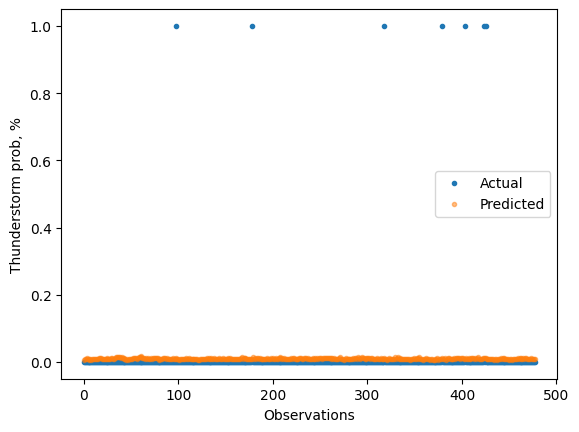

In [75]:
# plot baseline and predictions
plt.figure()
plt.plot(test_y, label="Actual", linestyle = "None", marker = ".")
plt.plot(testPredict, alpha = 0.5, linestyle = "None", marker = ".", label="Predicted")
#plt.plot(testPredictPlot, alpha = 0.5)
plt.ylabel(r"Thunderstorm prob, %")
plt.xlabel(r"Observations")
plt.legend(loc="best")
plt.show()

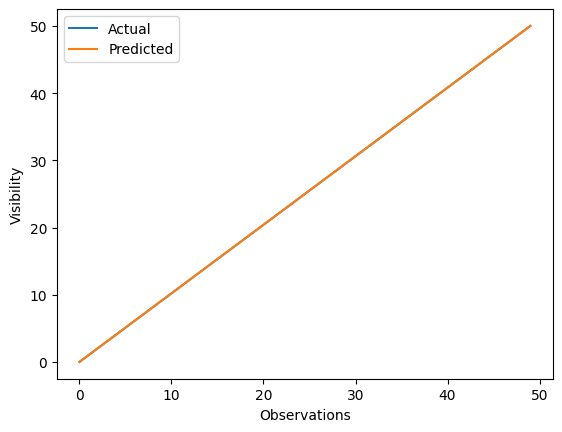

In [13]:
plt.figure()
plt.plot(np.linspace(0,50), label="Actual")
plt.plot(np.linspace(0,50), label="Predicted")
#plt.plot(testPredictPlot, alpha = 0.5)
plt.ylabel(r"Visibility")
plt.xlabel(r"Observations")
plt.legend(loc="best")
plt.show()

In [14]:
scaler.inverse_transform(dataset[0:500])

NameError: name 'dataset' is not defined